[06/01/23 12:32:48] ERROR    issue loading plot                               ]8;id=1685615568.784842-497402;file:///home/cy0/.local/lib/python3.8/site-packages/vaex/__init__.py\__init__.py]8;;\:818
                             Traceback (most recent call last):                              
                               File "/home/cy0/.local/lib/python3.8/site-pack                
                             ages/vaex/__init__.py", line 815, in <module>                   
                                 add_namespace = entry.load()                                
                               File "/usr/local/lib/python3.8/dist-packages/p                
                             kg_resources/__init__.py", line 2449, in load                   
                                 self.require(*args, **kwargs)                               
                               File "/usr/local/lib/python3.8/dist-packages/p                
                             kg_resources/__init__.py", line 2472, in require                
                                 items = working_set.resolve(reqs, env,                      
                             installer, extras=self.extras)                                  
                               File "/usr/local/lib/python3.8/dist-packages/p                
                             kg_resources/__init__.py", line 777, in resolve                 
                                 raise VersionConflict(dist,                                 
                             req).with_context(dependent_req)                                
                             pkg_resources.ContextualVersionConflict:                        
                             (typing-extensions 4.5.0                                        
                             (/home/cy0/.local/lib/python3.8/site-packages),                 
                             Requirement.parse('typing-extensions<4.0.0,>=3.7                
                             .4'), {'rich'})

                    ERROR    issue loading astro                              ]8;id=1685615568.8267453-688958;file:///home/cy0/.local/lib/python3.8/site-packages/vaex/__init__.py\__init__.py]8;;\:818
                             Traceback (most recent call last):                              
                               File "/home/cy0/.local/lib/python3.8/site-pack                
                             ages/vaex/__init__.py", line 815, in <module>                   
                                 add_namespace = entry.load()                                
                               File "/usr/local/lib/python3.8/dist-packages/p                
                             kg_resources/__init__.py", line 2449, in load                   
                                 self.require(*args, **kwargs)                               
                               File "/usr/local/lib/python3.8/dist-packages/p                
                             kg_resources/__init__.py", line 2472, in require                
                                 items = working_set.resolve(reqs, env,                      
                             installer, extras=self.extras)                                  
                               File "/usr/local/lib/python3.8/dist-packages/p                
                             kg_resources/__init__.py", line 777, in resolve                 
                                 raise VersionConflict(dist,                                 
                             req).with_context(dependent_req)                                
                             pkg_resources.ContextualVersionConflict:                        
                             (typing-extensions 4.5.0                                        
                             (/home/cy0/.local/lib/python3.8/site-packages),                 
                             Requirement.parse('typing-extensions<4.0.0,>=3.7                
                             .4'), {'rich'})

HAPI version: 1.2.2.0
To get the most up-to-date version please check http://hitran.org/hapi
ATTENTION: Python versions of partition sums from TIPS-2021 are now available in HAPI code

           MIT license: Copyright 2021 HITRAN team, see more at http://hitran.org. 

           If you use HAPI in your research or software development,
           please cite it using the following reference:
           R.V. Kochanov, I.E. Gordon, L.S. Rothman, P. Wcislo, C. Hill, J.S. Wilzewski,
           HITRAN Application Programming Interface (HAPI): A comprehensive approach
           to working with spectroscopic data, J. Quant. Spectrosc. Radiat. Transfer 177, 15-30 (2016)
           DOI: 10.1016/j.jqsrt.2016.03.005

           ATTENTION: This is the core version of the HITRAN Application Programming Interface.
                      For more efficient implementation of the absorption coefficient routine, 
                      as well as for new profiles, parameters and other functional,
      

/home/cy0/.local/lib/python3.8/site-packages/radis/misc/warning.py:369: LinestrengthCutoffWarning: Estimated error after discarding lines is large: 0.02%. Consider reducing cutoff
  warnings.warn(WarningType(message))
/home/cy0/.local/lib/python3.8/site-packages/radis/misc/warning.py:369: LinestrengthCutoffWarning: Estimated error after discarding lines is large: 0.02%. Consider reducing cutoff
  warnings.warn(WarningType(message))
/home/cy0/.local/lib/python3.8/site-packages/radis/misc/warning.py:369: AccuracyWarning: Some lines are too narrow (FWHM ~ 0.03 cm⁻¹) for the current spectral grid (wstep=0.01). Please reduce wstep to below 0.01 cm⁻¹. You can use wstep='auto' to get the optimal spectral grid value. You can also ignore by setting `warnings={'AccuracyWarning':'ignore'}` or change the 'GRIDPOINTS_PER_LINEWIDTH_WARN_THRESHOLD' key of radis.config / your ~/radis.json (if you know what you're doing!)
  warnings.warn(WarningType(message))
/home/cy0/.local/lib/python3.8/site-package

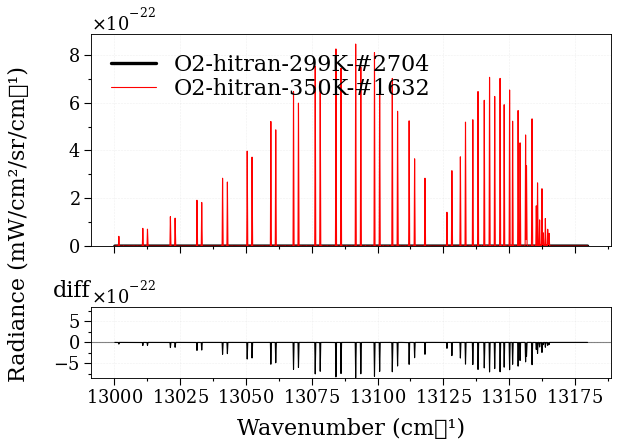

(<Figure size 640x480 with 2 Axes>,
 [<AxesSubplot: >, <AxesSubplot: xlabel='Wavenumber (cm⁻¹)'>])

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from radis import calc_spectrum
from radis.spectrum.compare import plot_diff
s = calc_spectrum(13000, 13180,         # cm-1
                  molecule='O2',
                  isotope='1,2,3',
                  pressure=0.1,   # bar
                  Tgas=299,          # K
                  mole_fraction=0.21,
                  path_length=1,      # cm
                  )

d = calc_spectrum(13000, 13180,         # cm-1
                  molecule='O2',
                  isotope='1,2,3',
                  pressure=0.001,   # bar
                  Tgas=350,          # K
                  mole_fraction=0.1,
                  path_length=1000000,      # cm
                  )
#
s.apply_slit(0.01, 'nm')
d.apply_slit(0.01, 'nm')

plot_diff(s1=s,s2=d)

In [2]:
#s.plot("transmittance")

In [3]:
spec_panda = s.to_pandas()
import pandas as pd
import plotly.express as px
px.line(spec_panda,x="wavespace", y="transmittance", template='plotly_dark')

In [4]:
import plotly.io as pio

spec_panda_emission = d.to_pandas()

layout = {'title': '8th Oct BESS'}
traces = []

traces.append({'y': spec_panda_emission['radiance'], 'x': spec_panda_emission['wavespace'],'name': 'Radiance'})
traces.append({'y': spec_panda['transmittance'], 'x': spec_panda['wavespace'], 'name': 'Transmission', 'yaxis': 'y2'})

layout['yaxis1'] = {'title': 'Radiance', 'titlefont': {'color': 'orange'}, 'tickfont': {'color': 'orange'}}
layout['yaxis2'] = {'title': 'Transmission', 'side': 'right', 'overlaying': 'y', 'anchor': 'x', 'titlefont': {'color': 'red'}, 'tickfont': {'color': 'red'}}
layout['template'] = "plotly_dark"

pio.show({'data': traces, 'layout': layout})

0      1458.420705
1      2068.475555
2      2230.220986
3      2354.702548
4      5223.749656
          ...     
92    49650.907063
93    49714.881037
94    49819.182247
95    49854.427490
96    56133.827294
Name: wav, Length: 97, dtype: float64

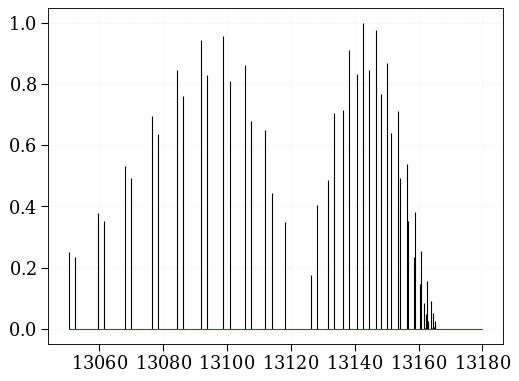

In [5]:
import numpy as np
lit_wavenumber = 13047.0 # 1/cm
lit_angle = 6.6018*(np.pi/180) # deg

from radis.io.hitran import fetch_hitran
df = fetch_hitran("O2", load_wavenum_min=lit_wavenumber, load_wavenum_max=13180, isotope="1")
df["int"] = df["int"] /df["int"].abs().max()
fig, ax = plt.subplots()
ax.stem(df["wav"], df["int"], markerfmt=' ')
plt.show

pixel_size = 11.0*10**(-6) # m/pixel
fx = 4*np.tan(lit_angle*(df.wav-lit_wavenumber)*(10**(-2)))
fx/pixel_size # 1/m

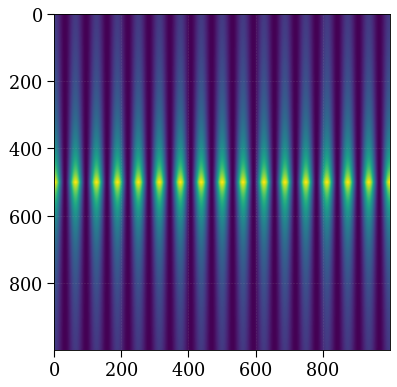

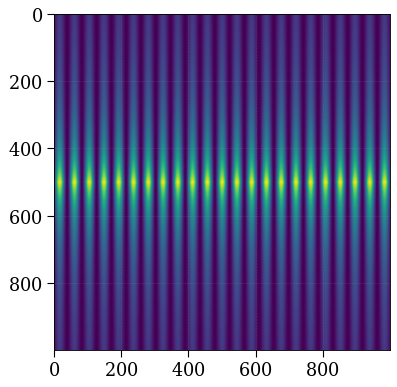

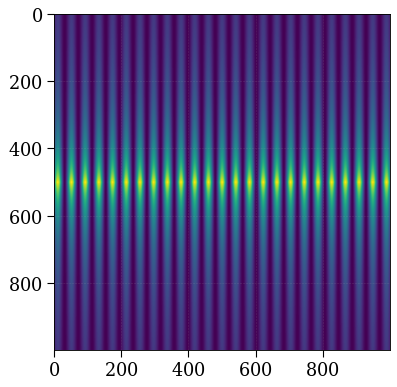

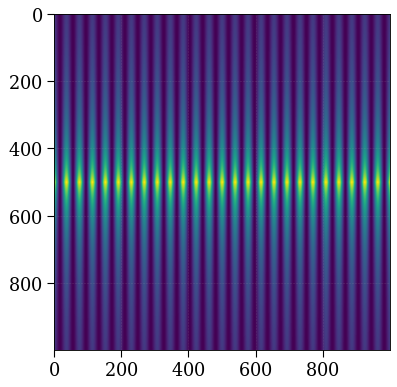

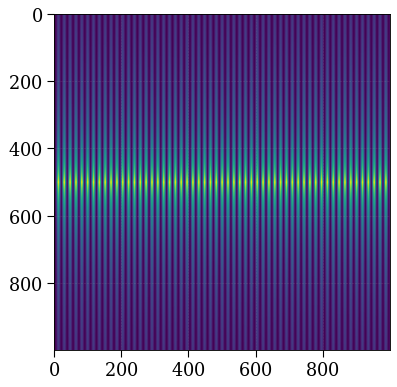

...

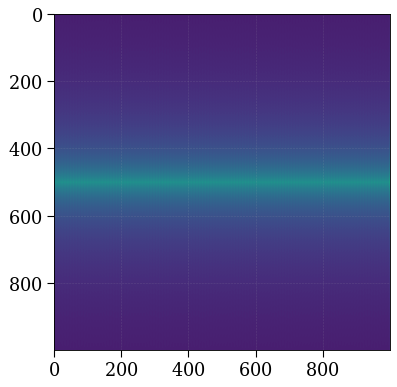

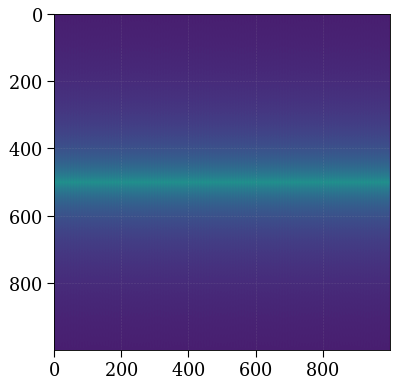

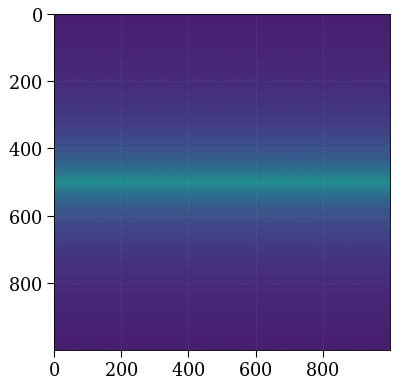

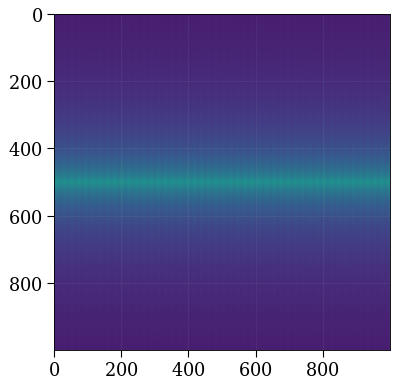

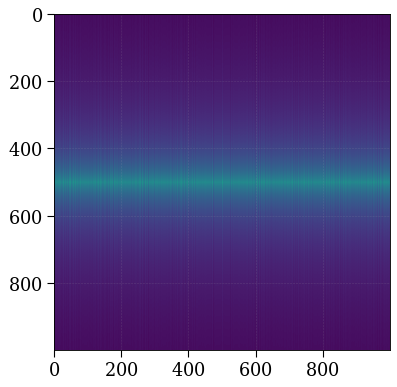

In [6]:
# gratings.py
import numpy as np
detector_edge_size = 1000
x = np.arange(-detector_edge_size//2, detector_edge_size//2, 1)
X, Y = np.meshgrid(x, x)
phase = 0
V=1
interferogram = np.zeros(shape=(detector_edge_size, detector_edge_size))

for frequency,amplitude in zip(fx,df.int):
    mono_interferogram = amplitude*(1+V*np.cos(2*np.pi*X*frequency+phase))*(1/(1+abs(Y)*0.01))
    plt.imshow(mono_interferogram)
    plt.show()
    interferogram = interferogram + mono_interferogram
plt.imshow(interferogram)
#plt.axis([None, None, 0, 1.4*10**(-19)])
plt.show()

In [7]:
row = interferogram[500,:]

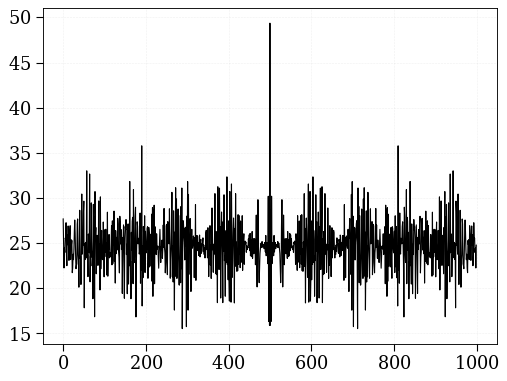

In [8]:
plt.plot(row)

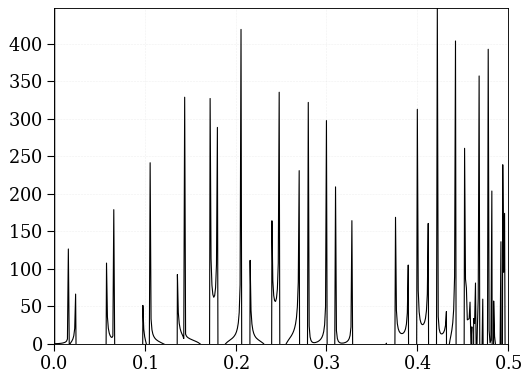

In [9]:
sp = np.fft.fft(row)
freq = np.fft.fftfreq(row.shape[-1])
plt.plot(freq, sp.real)
plt.axis([0, 0.5, 0, sp.real[np.argsort(sp.real)[-2].tolist()]])
plt.show()

In [10]:
from skimage.filters import gaussian
from scipy.ndimage import convolve

2.0


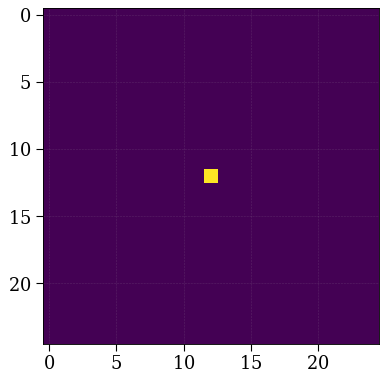

In [11]:
perfect_psf = np.zeros( (25,25) )
perfect_psf[12, 12] = 2
print(perfect_psf.max())
plt.imshow(perfect_psf)
plt.show()

0.07958027028152803


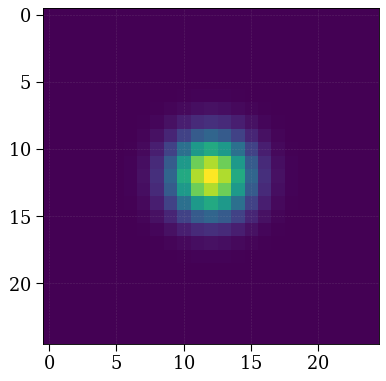

In [12]:
psf = gaussian(perfect_psf, sigma=2)
print(psf.max())
plt.imshow(psf)
plt.show()

52.490827953249415

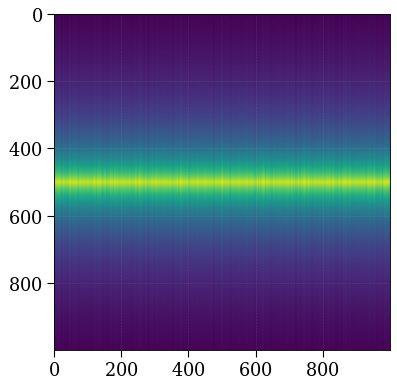

In [13]:
convolved = convolve(interferogram, psf)
#convolved = np.pad(convolved, pad_width=50)
plt.imshow(convolved)
convolved.max()

52.490827953249415


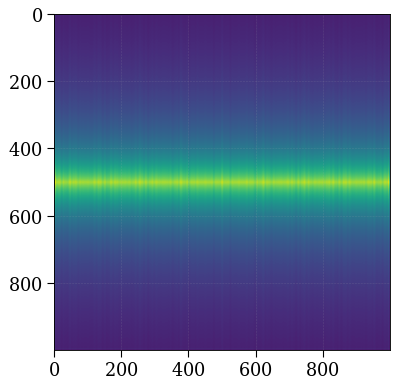

In [14]:
from skimage import color, data, restoration
number_of_iterations = 2
deconvolved = restoration.richardson_lucy(convolved, psf, num_iter=number_of_iterations, clip=False)
print(convolved.max())
plt.imshow(deconvolved)

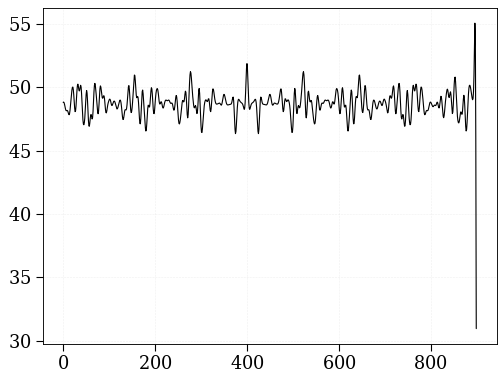

In [15]:
row_deconv = deconvolved[500,100:1000]
row_deconv.max()
plt.plot(row_deconv)

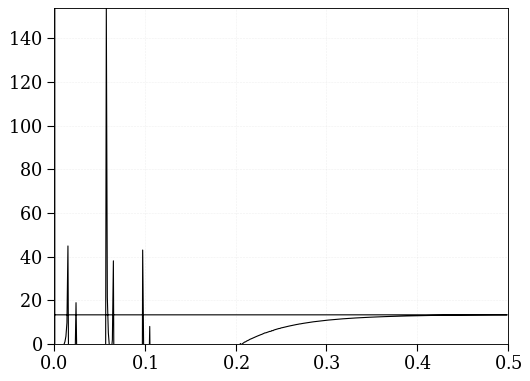

In [16]:
sp = np.fft.fft(row_deconv)
freq = np.fft.fftfreq(row_deconv.shape[-1])
plt.plot(freq, sp.real)
plt.axis([0, 0.5, 0, sp.real[np.argsort(sp.real)[-2].tolist()]])
plt.show()